# Compare activations

- We are going to compare the activations in the best model with the baseline model. And the images that we are going to use as input will be the ones that were falsely positive in the baseline model, but now truly negative in the improved model. The classification of these images differ between the two models, so the difference in activation should tell us why the new model performs better.

- First, we need to load the test data en test both models, and extract the required images.

In [1]:
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
import pandas as pd

# Display
from IPython.display import Image, display
import matplotlib.pyplot as plt
import matplotlib.cm as cm

os.chdir('/home/ubuntu/Thesis-KNMI-FoggyGAN/')
df_test = pd.read_pickle('data/raw/test_annotations.pkl')

keep = [0, 20, 21, 30, 31]
df_test = df_test[df_test.day_phase.isin(keep)]
df_test = df_test[df_test.label != 'Cannot Say'] # Drop images with label cannot say

mapping = {'No Fog':0, 'Fog':1}
y_true = df_test['label'].map(mapping)

# Load models

In [59]:
from keras.models import load_model

b_model = load_model('models/baseline/baseline_model.h5')
new_model = load_model('models/new/model4.h5')

# Remove last layer's softmax
# b_model.layers[-1].activation = None
# new_model.layers[-1].activation = None

In [60]:
b_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 247, 247, 12)      3612      
_________________________________________________________________
dropout (Dropout)            (None, 247, 247, 12)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 123, 123, 12)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 119, 119, 8)       2408      
_________________________________________________________________
dropout_1 (Dropout)          (None, 119, 119, 8)       0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 59, 59, 8)         0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 55, 55, 8)         1

In [61]:
new_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 247, 247, 12)      3612      
_________________________________________________________________
dropout_4 (Dropout)          (None, 247, 247, 12)      0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 123, 123, 12)      0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 119, 119, 8)       2408      
_________________________________________________________________
dropout_5 (Dropout)          (None, 119, 119, 8)       0         
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 59, 59, 8)         0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 55, 55, 8)        

# Preprocessing

Both models take same input. So we only preprocess once.

In [3]:
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
import numpy as np

datadir = 'data/raw/test'
images = []


for fname in df_test.filename.values:
    img = load_img(os.path.join(datadir, fname), target_size=(256, 256))
    img = img_to_array(img)
    img = img/255
    images.append(img)

images = np.asarray(images)

# Predict

We are going to predict for both models.

In [4]:
b_probas = b_model.predict(images)
new_probas = new_model.predict(images)

b_y_pred = (b_probas > 0.5).astype('int32')
new_y_pred = (new_probas > 0.5).astype('int32')

# Store predictions in dataframe:
df_test['baseline_prediction'] = b_y_pred
df_test['new_prediction'] = new_y_pred

# GradCAM algorithm

In [103]:
def get_img_array(img_path, size):
    # `img` is a PIL image
    img = keras.preprocessing.image.load_img(img_path, target_size=(256, 256))
    # `array` is a float32 Numpy array of shape (256, 256, 3)
    array = keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    array = array/255 #rescale
    return array


def make_gradcam_heatmap(img_array, model, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    last_conv_layer_name = model.layers[-8].name
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.preprocessing.image.load_img(img_path, target_size=(256, 256))
    img = keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(Image(cam_path))

# Get required images

We want to have the images with true label No Fog, that were classified as foggy in the baseline model, and as no fog in the new model.

In [104]:
df_selected = df_test[(df_test.label == 'No Fog') & (df_test.baseline_prediction == 1) & (df_test.new_prediction == 0)]
df_selected

,filepath,label,day_phase,filename,baseline_prediction,new_prediction
2375,/nas-research.knmi.nl/sensordata/CAMERA/RWS/A9...,No Fog,0,A9-HM493-ID12818_20190430_0021.jpg,1,0
4991,/nas-research.knmi.nl/sensordata/CAMERA/RWS/A9...,No Fog,0,A9-HM312-ID11179_20170912_2031.jpg,1,0
2825,/nas-research.knmi.nl/sensordata/CAMERA/RWS/A2...,No Fog,0,A2-HM905-ID13470_20190502_0000.jpg,1,0
288,/nas-research.knmi.nl/sensordata/CAMERA/RWS/A2...,No Fog,20,A28-HM1966-ID13519_20190705_0140.jpg,1,0
12610,/nas-research.knmi.nl/sensordata/CAMERA/RWS/A9...,No Fog,0,A9-HM432-ID12853_20191231_1841.jpg,1,0
...,...,...,...,...,...,...
35924,/nas-research.knmi.nl/sensordata/CAMERA/RWS/A9...,No Fog,20,A9-HM469-ID12832_20191230_0641.jpg,1,0
6457,/nas-research.knmi.nl/sensordata/CAMERA/RWS/A9...,No Fog,0,A9-HM432-ID12853_20191007_2010.jpg,1,0
5123,/nas-research.knmi.nl/sensordata/CAMERA/RWS/A5...,No Fog,0,A50-HM1922-ID11619_20190810_2230.jpg,1,0
33717,/nas-research.knmi.nl/sensordata/CAMERA/RWS/A2...,No Fog,0,A2-HM748-ID10907_20170917_0041.jpg,1,0


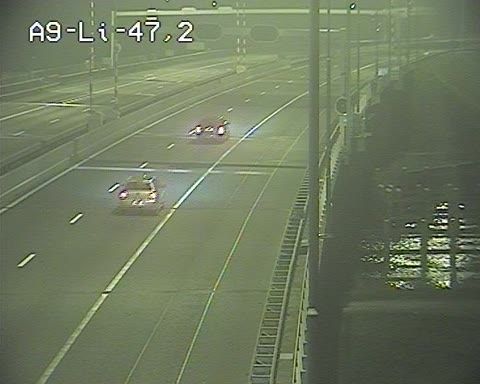

In [145]:
datadir = 'data/raw/test'
sample_fname = df_selected.sample().filename.values[0]
# sample_fname = df_test[df_test.label == 'Fog'].sample().filename.values[0]

img_path = os.path.join(datadir, sample_fname)
display(Image(img_path))

In [146]:
img_array = get_img_array(img_path, size=(256, 256))

BASELINE MODEL
True label: No Fog
Predicted class:  [[1]]
Probability:  0.5729453


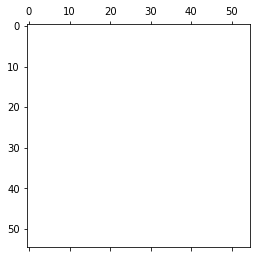

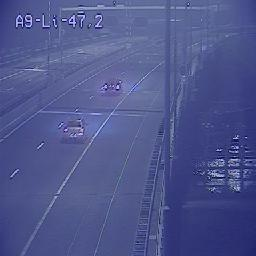

In [149]:
probas = b_model.predict(img_array)
predicted_class = (probas > 0.5).astype('int32')

print('BASELINE MODEL')
print('True label: No Fog')
print('Predicted class: ', str(predicted_class))
print('Probability: ', probas[0][0])

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, b_model)

# Display heatmap
plt.matshow(heatmap)
plt.show()
save_and_display_gradcam(img_path, heatmap)

NEW MODEL
True label: No Fog
Predicted class:  [[0]]
Probability:  0.29633456


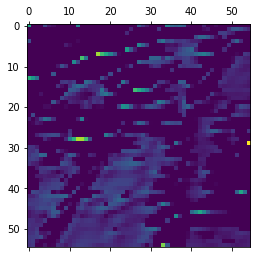

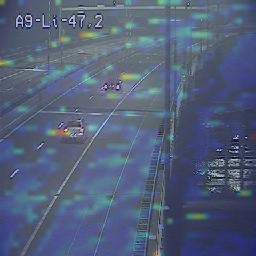

In [150]:
probas = new_model.predict(img_array)
predicted_class = (probas > 0.5).astype('int32')

print('NEW MODEL')
print('True label: No Fog')
print('Predicted class: ', str(predicted_class))
print('Probability: ', probas[0][0])

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, new_model)

# Display heatmap
plt.matshow(heatmap)
plt.show()
save_and_display_gradcam(img_path, heatmap)

# Save more activation images

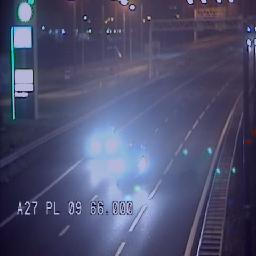

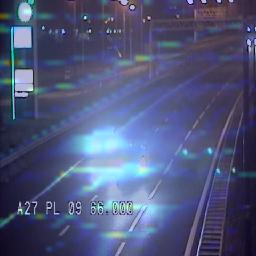

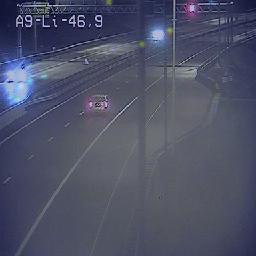

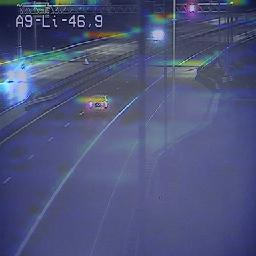

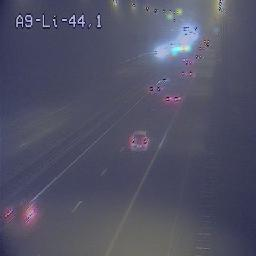

...

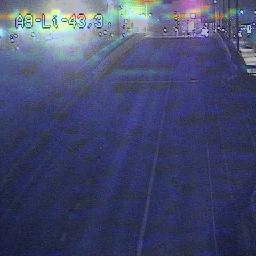

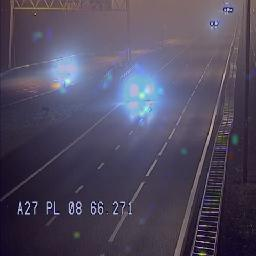

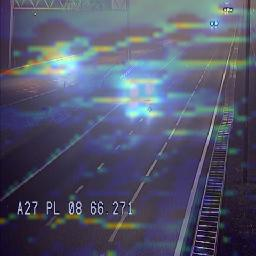

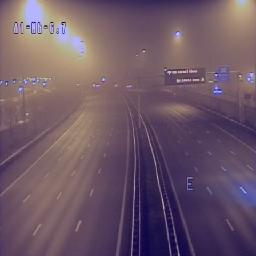

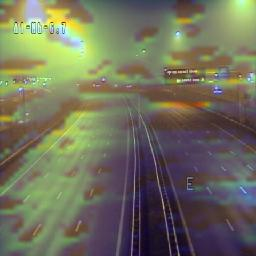

In [157]:
fnames = df_selected.sample(100, random_state=17).filename.values
datadir = datadir = 'data/raw/test'
targetdir = 'reports/activation_maps'

for fname in fnames:
    source_path = os.path.join(datadir, fname)
    img_array = get_img_array(source_path, size=(256, 256))
    baseline_heatmap = make_gradcam_heatmap(img_array, b_model)
    new_heatmap = make_gradcam_heatmap(img_array, new_model)
    
    save_and_display_gradcam(source_path, baseline_heatmap, cam_path=os.path.join(targetdir, 'baseline', fname))
    save_and_display_gradcam(source_path, new_heatmap, cam_path=os.path.join(targetdir, 'new', fname))

In [192]:
baseline_activations = [plt.imread(os.path.join('reports/activation_maps/baseline', fname)) for fname in os.listdir('reports/activation_maps/baseline') if fname.endswith('.jpg')]
new_activations = [plt.imread(os.path.join('reports/activation_maps/new', fname)) for fname in os.listdir('reports/activation_maps/new') if fname.endswith('.jpg')]

baseline_filenames = [fname for fname in os.listdir('reports/activation_maps/baseline') if fname.endswith('.jpg')]
new_filenames = [fname for fname in os.listdir('reports/activation_maps/new') if fname.endswith('.jpg')]

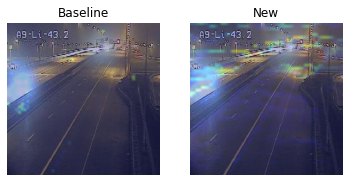

In [193]:
f, axarr = plt.subplots(1,2)

axarr[0].imshow(baseline_activations[96])
axarr[0].axis('off')
axarr[0].set_title('Baseline')

axarr[1].imshow(new_activations[96])
axarr[1].axis('off')
axarr[1].set_title('New')

plt.savefig('img.jpg')

# axarr[1,0].imshow(baseline_activations[1])
# axarr[1,1].imshow(new_activations[1])

<ipython-input-194-be52c1b24a0d>:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, axarr = plt.subplots(1,2)


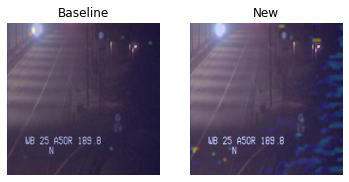

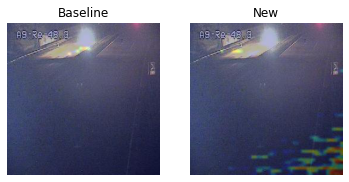

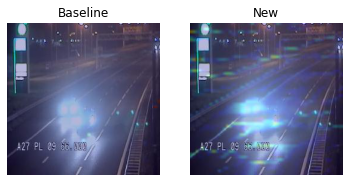

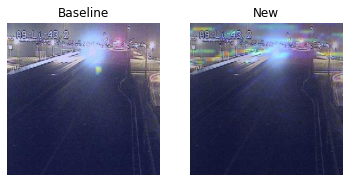

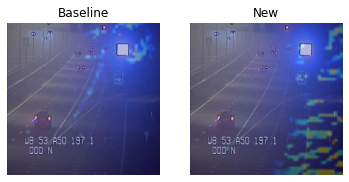

...

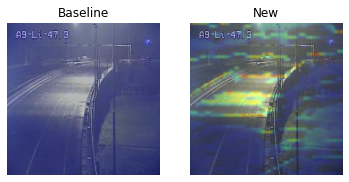

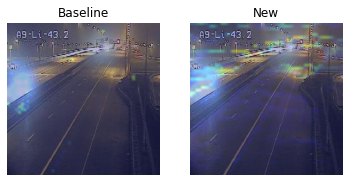

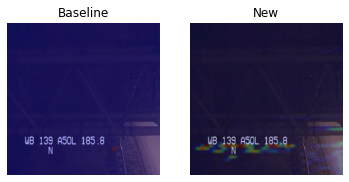

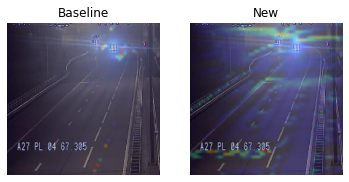

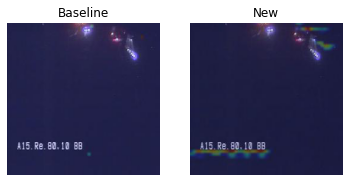

In [194]:
# Save side by side plots
target_dir = 'reports/activation_maps/side_by_side'

for i in range(len(baseline_activations)):
    target_fname = baseline_filenames[i]
    target_path = os.path.join(target_dir, target_fname)
    
    f, axarr = plt.subplots(1,2)

    axarr[0].imshow(baseline_activations[i])
    axarr[0].axis('off')
    axarr[0].set_title('Baseline')

    axarr[1].imshow(new_activations[i])
    axarr[1].axis('off')
    axarr[1].set_title('New')
    
    plt.savefig(target_path)